# Exploración de datos

In [33]:
import sys
import os
from functools import reduce

project_path = os.path.abspath('..')
sys.path.insert(1, project_path)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from src.utils import get_project_root
from src.data.make_dataset import get_minma_data

Para una exploración inicial de los datos, se utilizarán datos desde 5 años atrás de las siguientes variables presentes en ambas estaciones:
- SO2
- NO2
- NO
- NOX
- O3
- CO
- Dirección del viento
- Velocidad del viento

NORMA: ANUAL 80 microgramos /metrocubico
24H: 365 microgramos/metrocubico

In [34]:
params = ['SO2','NO2', 'NO', 'NOX', 'O3'] # NO HAY CO
from_last = '5y'

## ConCon

In [35]:
ventanas_df = get_minma_data(params, 'ventanas', from_last=from_last)
ventanas_df.head()

c:\users\nicol\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version
  """Entry point for launching an IPython kernel.


,Registros validados_SO2,Registros preliminares_SO2,Registros no validados_SO2,Registros validados_NO2,Registros preliminares_NO2,Registros no validados_NO2,Registros validados_NO,Registros preliminares_NO,Registros no validados_NO,Registros validados_NOX,Registros preliminares_NOX,Registros no validados_NOX,Registros validados_O3,Registros preliminares_O3,Registros no validados_O3
2017-10-04 18:00:00,NaN,NaN,2.31,NaN,NaN,4.54,NaN,NaN,2.05393,NaN,NaN,6.50358,NaN,NaN,15.0
2017-10-04 19:00:00,NaN,NaN,2.12,NaN,NaN,3.65,NaN,NaN,1.63730,NaN,NaN,5.28568,NaN,NaN,16.0
2017-10-04 20:00:00,NaN,NaN,2.15,NaN,NaN,3.59,NaN,NaN,1.64193,NaN,NaN,5.22860,NaN,NaN,17.0
2017-10-04 21:00:00,NaN,NaN,2.01,NaN,NaN,3.40,NaN,NaN,1.67473,NaN,NaN,5.07702,NaN,NaN,16.0
2017-10-04 22:00:00,NaN,NaN,2.11,NaN,NaN,3.40,NaN,NaN,1.62698,NaN,NaN,5.02203,NaN,NaN,16.0


In [36]:
ventanas_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43830 entries, 2017-10-04 18:00:00 to 2022-10-04 23:00:00
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Registros validados_SO2     0 non-null      float64
 1   Registros preliminares_SO2  0 non-null      float64
 2   Registros no validados_SO2  43310 non-null  float64
 3   Registros validados_NO2     0 non-null      float64
 4   Registros preliminares_NO2  0 non-null      float64
 5   Registros no validados_NO2  43221 non-null  float64
 6   Registros validados_NO      0 non-null      float64
 7   Registros preliminares_NO   0 non-null      float64
 8   Registros no validados_NO   43226 non-null  float64
 9   Registros validados_NOX     0 non-null      float64
 10  Registros preliminares_NOX  0 non-null      float64
 11  Registros no validados_NOX  43223 non-null  float64
 12  Registros validados_O3      0 non-null      float64
 

Se observa que de las columnas, las únicas que poseen datos son aquellas que tienen datos preliminares, por lo que el resto se descartará

In [37]:
cols_to_drop = list(ventanas_df.filter(regex='(?<!no validados)_.*')) 
ventanas_df = ventanas_df.drop(cols_to_drop, axis=1)

Valores nulos

In [38]:
ventanas_df.isna().sum()

Registros no validados_SO2    520
Registros no validados_NO2    609
Registros no validados_NO     604
Registros no validados_NOX    607
Registros no validados_O3     544
dtype: int64

Resumen estadístico

In [39]:
ventanas_df.describe()

,Registros no validados_SO2,Registros no validados_NO2,Registros no validados_NO,Registros no validados_NOX,Registros no validados_O3
count,43310.000000,43221.000000,43226.000000,43223.000000,43286.000000
mean,4.405123,7.279157,4.052840,11.302148,12.859146
std,6.253030,4.398773,6.140964,9.081920,5.580760
min,0.070000,0.170000,0.443233,0.902985,0.000000
25%,2.240000,3.970000,1.694608,5.969825,9.000000
50%,2.840000,6.160000,2.261500,8.737320,12.000000
75%,4.070000,9.590000,3.828350,13.418000,16.000000
max,199.110000,45.030000,251.305000,274.893000,43.000000


Histogramas

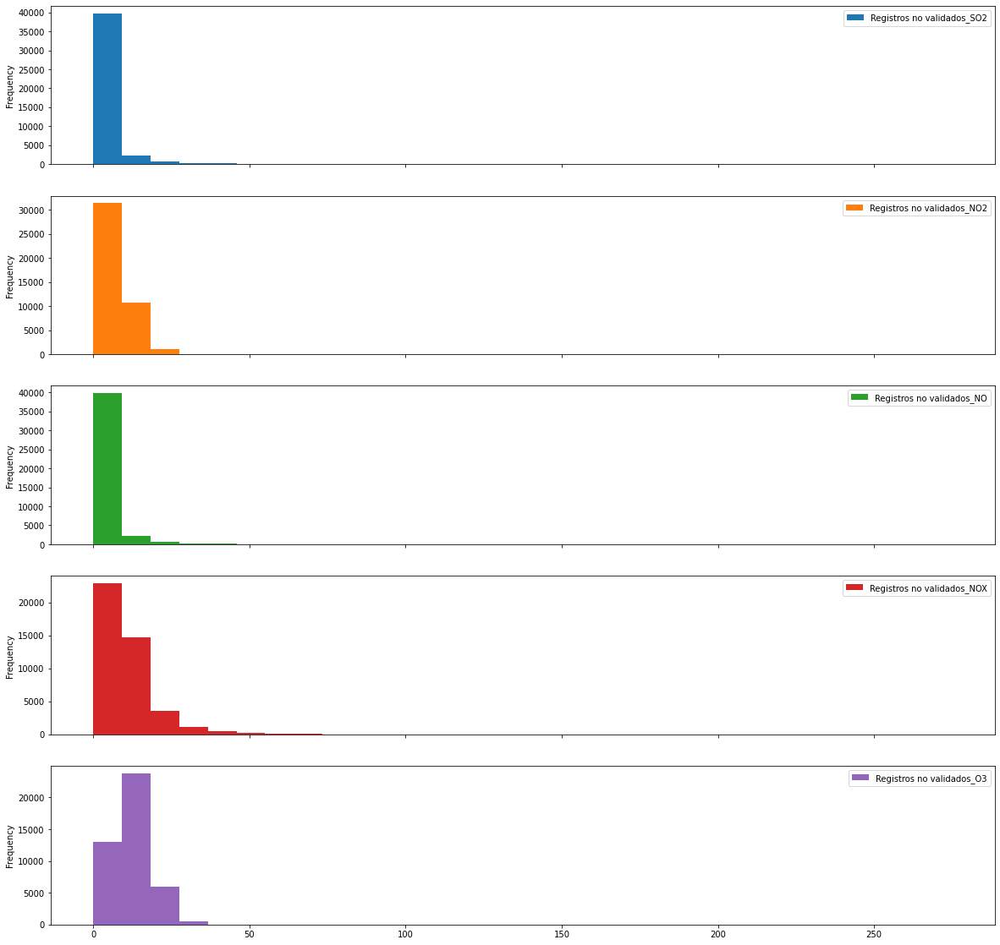

In [40]:
ventanas_df.plot.hist(subplots=True, figsize=(20,20), bins=30)
plt.show()

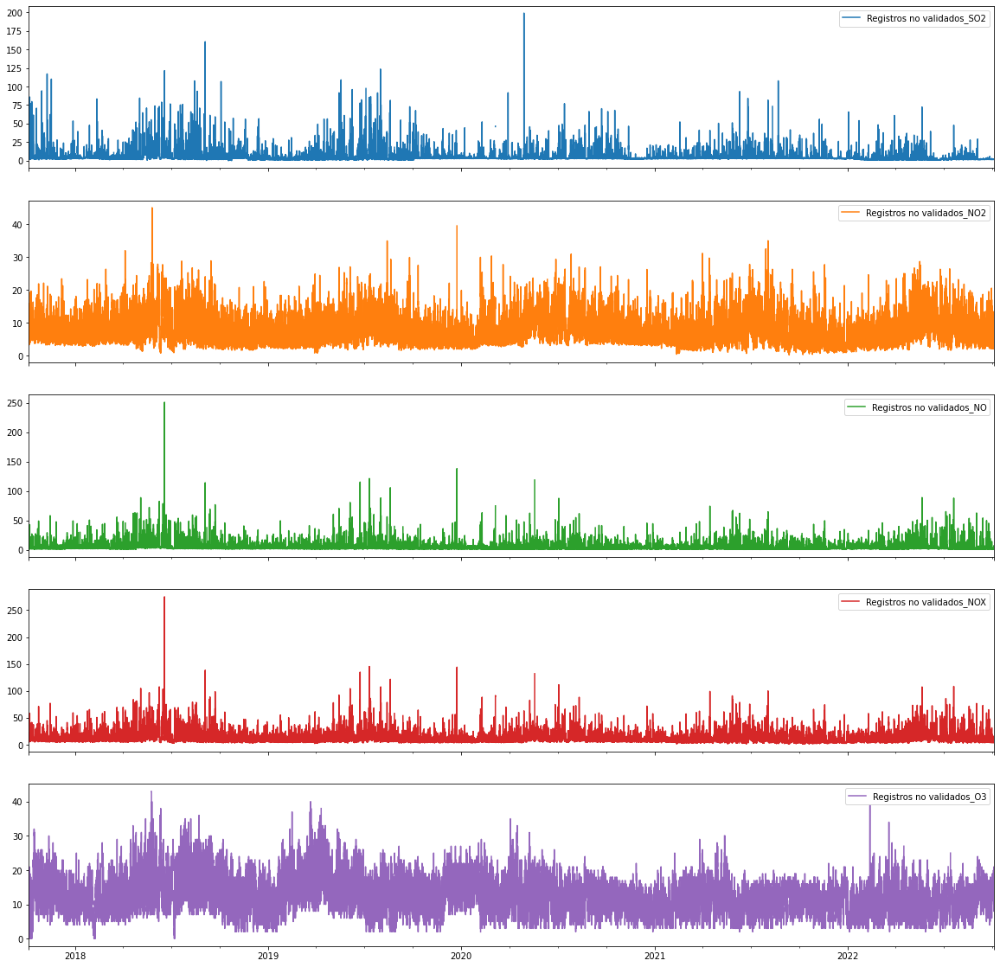

In [41]:
ventanas_df.plot(subplots=True, figsize=(20,20))
plt.show()

In [42]:
def ver_ultima_semana(df, dias_antes = 0):
    df_lw = df.iloc[(-24*dias_antes-168 -1):(-24*dias_antes-1)].interpolate()
    df_lw.plot(subplots=True, figsize=(20,20))
    plt.show()
    return df_lw
    
def ver_ultimo_ano(df, anos = 1, meses_antes = 0):
    df_lw = df.iloc[(-24*30*meses_antes-24*365*anos -1):(-24*30*meses_antes-1)].interpolate()
    df_lw.plot(subplots=True, figsize=(20,20))
    plt.show()
    return df_lw

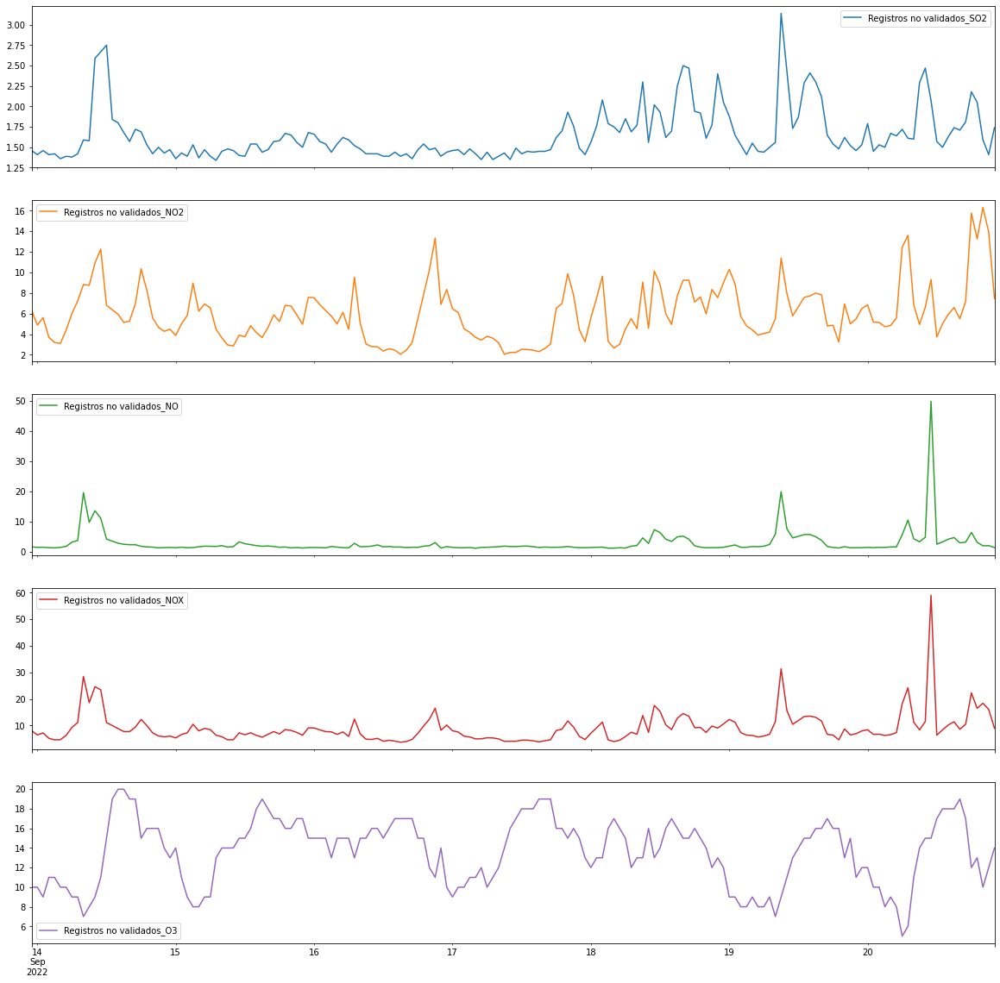

,Registros no validados_SO2,Registros no validados_NO2,Registros no validados_NO,Registros no validados_NOX,Registros no validados_O3
2022-09-13 23:00:00,1.46,6.33,1.72120,8.04961,10.0
2022-09-14 00:00:00,1.41,4.89,1.52632,6.41637,10.0
2022-09-14 01:00:00,1.46,5.61,1.57620,7.19081,9.0
2022-09-14 02:00:00,1.41,3.71,1.43648,5.14634,11.0
2022-09-14 03:00:00,1.42,3.19,1.39085,4.57630,11.0
...,...,...,...,...,...
2022-09-20 18:00:00,2.18,15.76,6.47998,22.24480,12.0
2022-09-20 19:00:00,2.05,13.26,3.20967,16.47120,13.0
2022-09-20 20:00:00,1.59,16.33,2.04353,18.37600,10.0
2022-09-20 21:00:00,1.41,13.93,2.10950,16.03770,12.0


In [43]:
ver_ultima_semana(ventanas_df, dias_antes = 14)

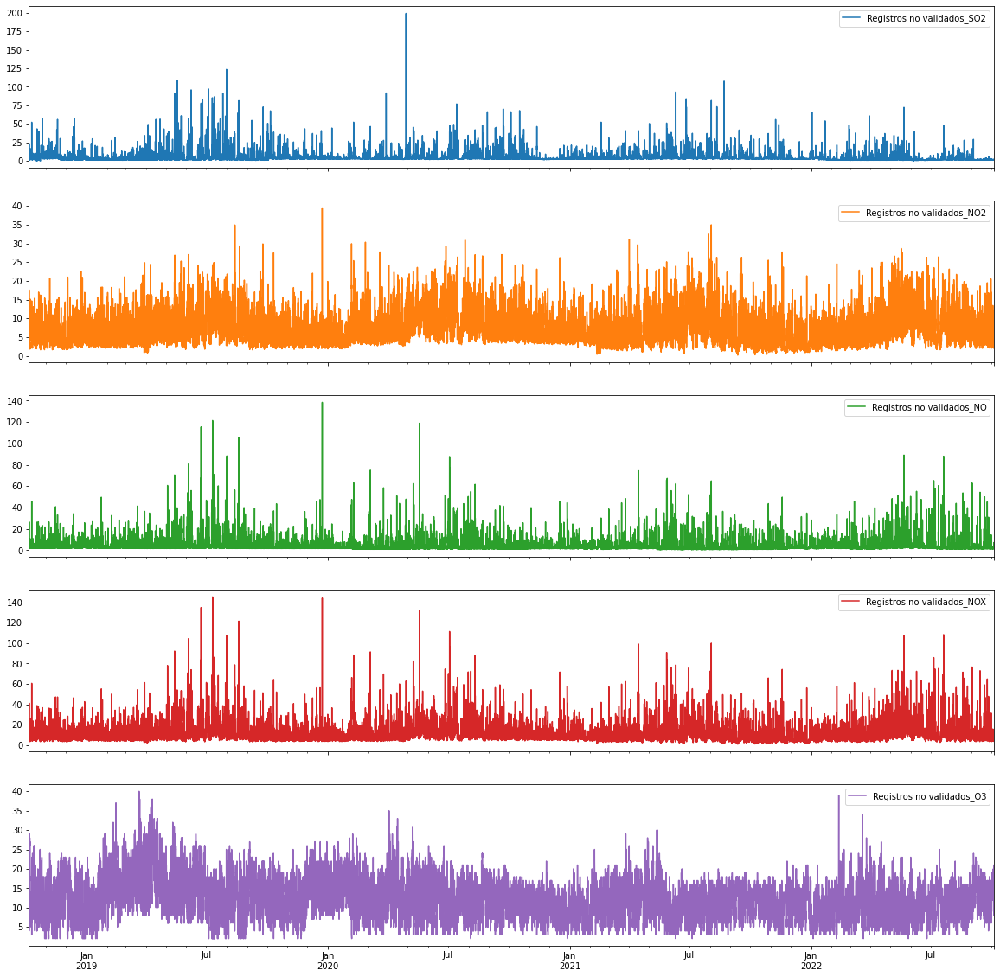

In [44]:
df_2anos = ver_ultimo_ano(ventanas_df, anos = 4)

In [45]:
#df_2anos = ver_ultimo_ano(concon_df, anos = 2)
#df_2anos["day"] = df_2anos.index.day
#df_2anos["month"] = df_2anos.index.month
#df_2anos.groupby(["day", "month"]).mean()

Visualización basada en:
https://github.com/KishManani/MSTL/blob/main/mstl_decomposition.ipynb

In [46]:
import seaborn as sns
from scipy.stats import circmean

In [47]:
def plot_por_mes(timeseries, col, log = False, circular = False):
    # Plot the electricity demand for each day
    fig, ax = plt.subplots(nrows=2, ncols=3, figsize=[15, 10], sharey=True)
    ax = ax.flatten()
    sns_blue = sns.color_palette(as_cmap=True)[0]
    MONTHS = ["Jan", "Feb", "Mar", "Apr", "May", "Jun"]
    for ix, month in enumerate(MONTHS):

        # Plot individual ts
        daily_ts = []
        for _, ts in (
            timeseries[[col, "day_of_month", "month"]]
            .query(f"month == {ix+1}")
            .groupby("day_of_month")
        ):
            daily_ts.append(ts.reset_index()[col])
            ts.reset_index()[col].plot(
                alpha=0.1, ax=ax[ix], color=sns_blue, label="_no_legend_"
            )
            ax[ix].set_xticks(np.arange(0, len(ts) + 1, 8))
            ax[ix].set_title(month)

        # Plot the mean ts
        if not circular:
            pd.concat(daily_ts, axis=1).mean(axis=1).plot(
                ax=ax[ix], color="blue", label="mean", legend=True
            )
        else:
            pd.concat(daily_ts, axis=1).apply(lambda x: circmean(x),axis=1).plot(
                ax=ax[ix], color="blue", label="mean", legend=True
            )
        ax[ix].legend(loc="upper left", frameon=False)
        if log:
            ax[ix].set_yscale('log')

        if month in ("Jan", "Feb"):
            ax[ix].tick_params(
                axis="x", which="both", bottom=False, top=False, labelbottom=False
            )

    fig.text(0.5, -0.02, "Hora del día", ha="center")
    fig.text(-0.02, 0.5, "Concentración", va="center", rotation="vertical")
    fig.suptitle("Emisiones de {} medidas cada día según el mes, en la estación Ventanas".format(col))
    #fig.delaxes(ax[-1])
    fig.tight_layout()
    plt.show()

def plot_por_semana(timeseries, col, log = False, circular = False):
    fig, ax = plt.subplots(figsize=[20, 10])
    weekly_ts = []
    sns_blue = sns.color_palette(as_cmap=True)
    DAYS = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
    for week, ts in timeseries.groupby("week"):
        weekly_ts.append(ts.reset_index()[col])
        ts.reset_index()[col].plot(alpha=0.1, ax=ax, label="_no_legend_", color=sns_blue)
        plt.xticks(ticks=np.arange(0, 167, 24), labels=DAYS)

    pd.concat(weekly_ts, axis=1).mean(axis=1).plot(
        ax=ax, color="blue", label="mean", legend=True
    )

    ax.set_ylabel("Concentración")
    ax.set_title("Emisiones de {} medidas cada día de la semana en la estación Ventanas".format(col))
    ax.set_xlabel("Día de la semana")
    if log:
            ax.set_yscale('log')
    ax.legend(loc="upper right", frameon=False)

    plt.tight_layout()
    plt.show()
    
def plot_por_ano(timeseries, col, circular = False):
    fig, ax = plt.subplots(figsize=[20, 10])
    yearly_ts = []
    sns_blue = sns.color_palette(as_cmap=True)
    MONTHS = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
    for month, ts in timeseries.groupby("year"):
        ts = ts.groupby(["month","day_of_month"]).mean()
        #print(ts.reset_index())
        yearly_ts.append(ts.reset_index()[col])
        ts.reset_index()[col].plot(alpha=0.1, ax=ax, label="_no_legend_", color=sns_blue)
        plt.xticks(ticks= [0, 31, 59, 90, 120, 151, 181, 212, 242, 273, 303, 334], labels=MONTHS)

    pd.concat(yearly_ts, axis=1).mean(axis=1).plot(
        ax=ax, color="blue", label="mean", legend=True
    )

    ax.set_ylabel("Concentración")
    ax.set_title("Emisiones de {} medidas cada mes en la estación Ventanas".format(col))
    ax.set_xlabel("Mes")
    ax.legend(loc="upper right", frameon=False)

    plt.tight_layout()
    plt.show()
    
def visualizar_trends(df, col = "SO2", ano_0 = 2021, log = False, circular = False):
    timeseries = df
    timeseries['Fecha'] = timeseries.index
    timeseries = timeseries.rename(columns={"Registros no validados_SO2": "SO2", "Registros no validados_NO2": "NO2", "Registros no validados_NO": "NO", "Registros no validados_NOX": "NOX", "Registros no validados_O3": "O3", "Registros no validados_CO": "CO"})
    
    # Filter for first 149 days of 2021.
    start_date = pd.to_datetime("{}-01-01".format(ano_0))
    end_date = start_date + pd.Timedelta("180D")
    mask = (timeseries["Fecha"] >= start_date) & (timeseries["Fecha"] < end_date)
    #mask = (timeseries.index >= start_date) & (timeseries.index < end_date)
    #timeseries_full = timeseries
    
    # Resample to hourly
    
    # Compute date time variables used later in plotting
    timeseries["week"] = timeseries.index.isocalendar().week
    timeseries["day_of_month"] = timeseries.index.day
    timeseries["month"] = timeseries.index.month
    timeseries["year"] = timeseries.index.year
    timeseries_full = timeseries
    timeseries = timeseries[mask]
    timeseries = timeseries.set_index("Fecha").resample("H").sum()
    plot_por_mes(timeseries, col, log = log, circular = circular)
    plot_por_semana(timeseries, col, log = log, circular = circular)
    plot_por_ano(timeseries_full, col, circular =  circular)
    
    

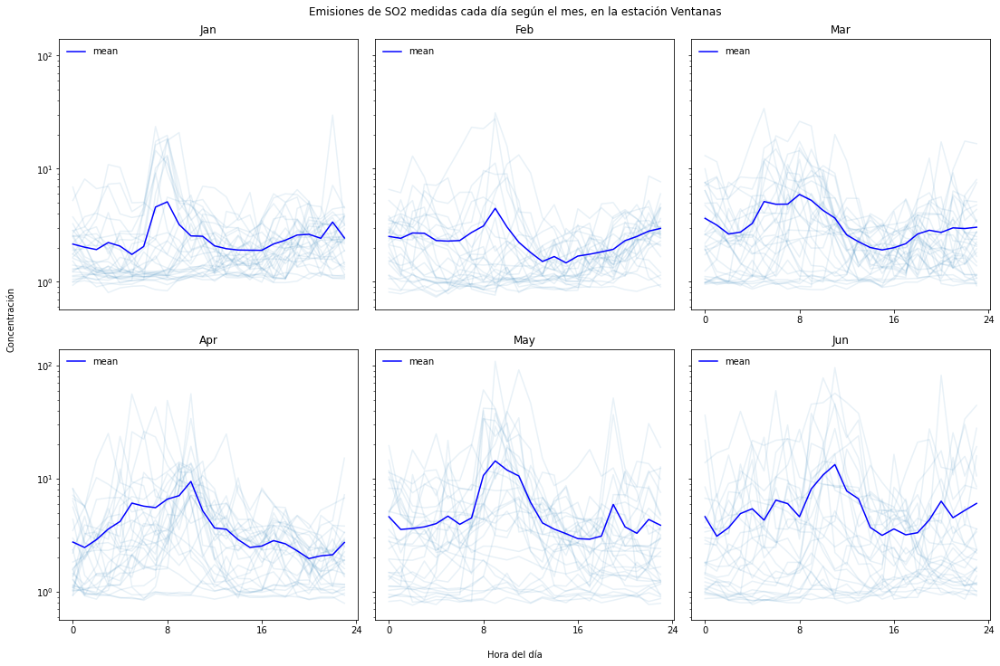

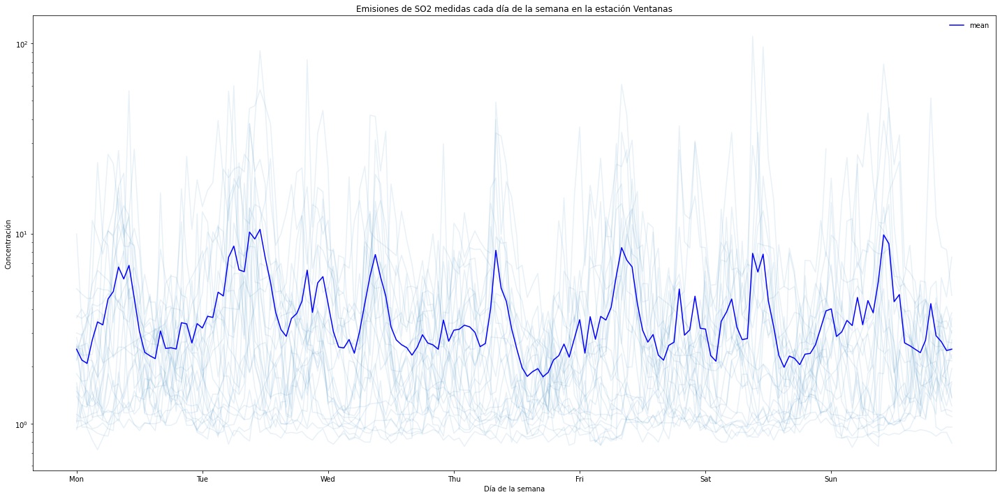

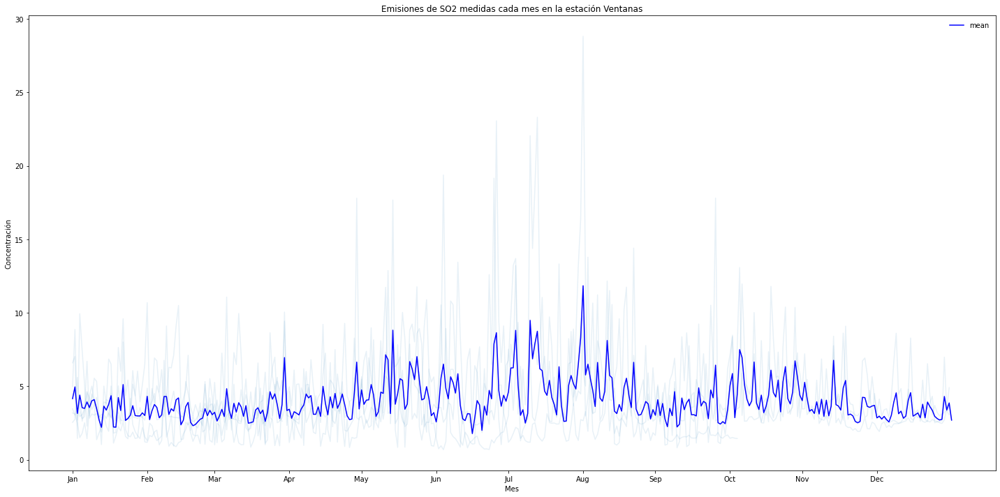

In [48]:
visualizar_trends(df_2anos, col = "SO2", ano_0=2019, log=True)

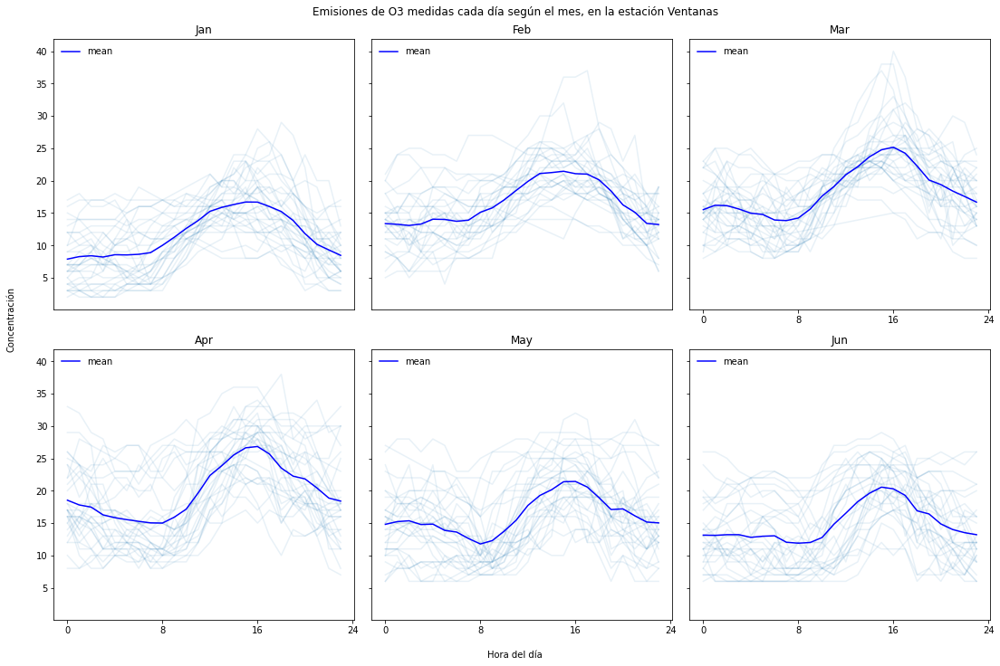

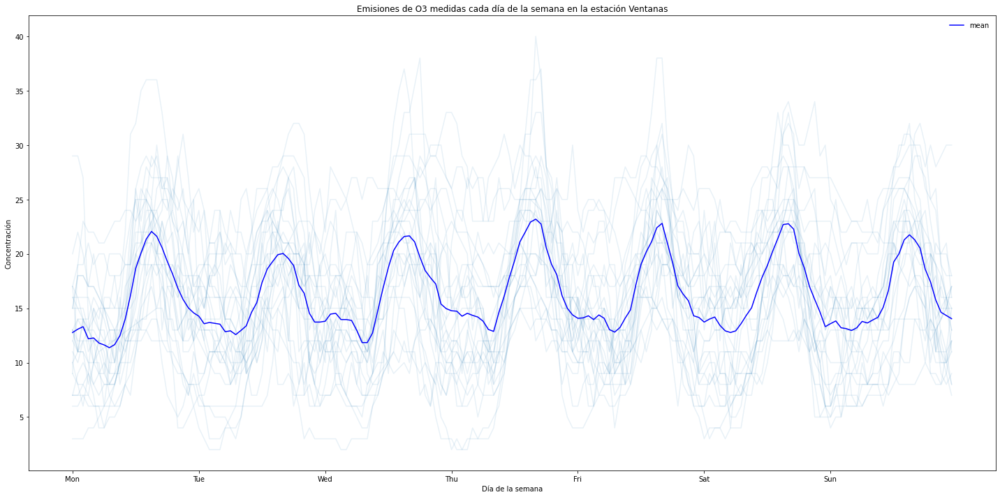

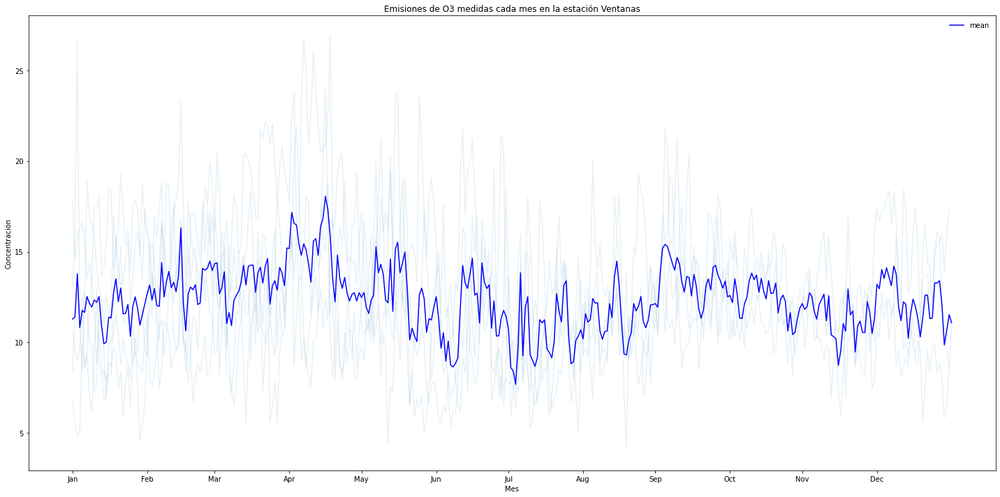

In [49]:
visualizar_trends(df_2anos, col = "O3", ano_0=2019)

In [50]:
import statsmodels.tsa.seasonal as Seasonal

In [51]:
STL = Seasonal.STL

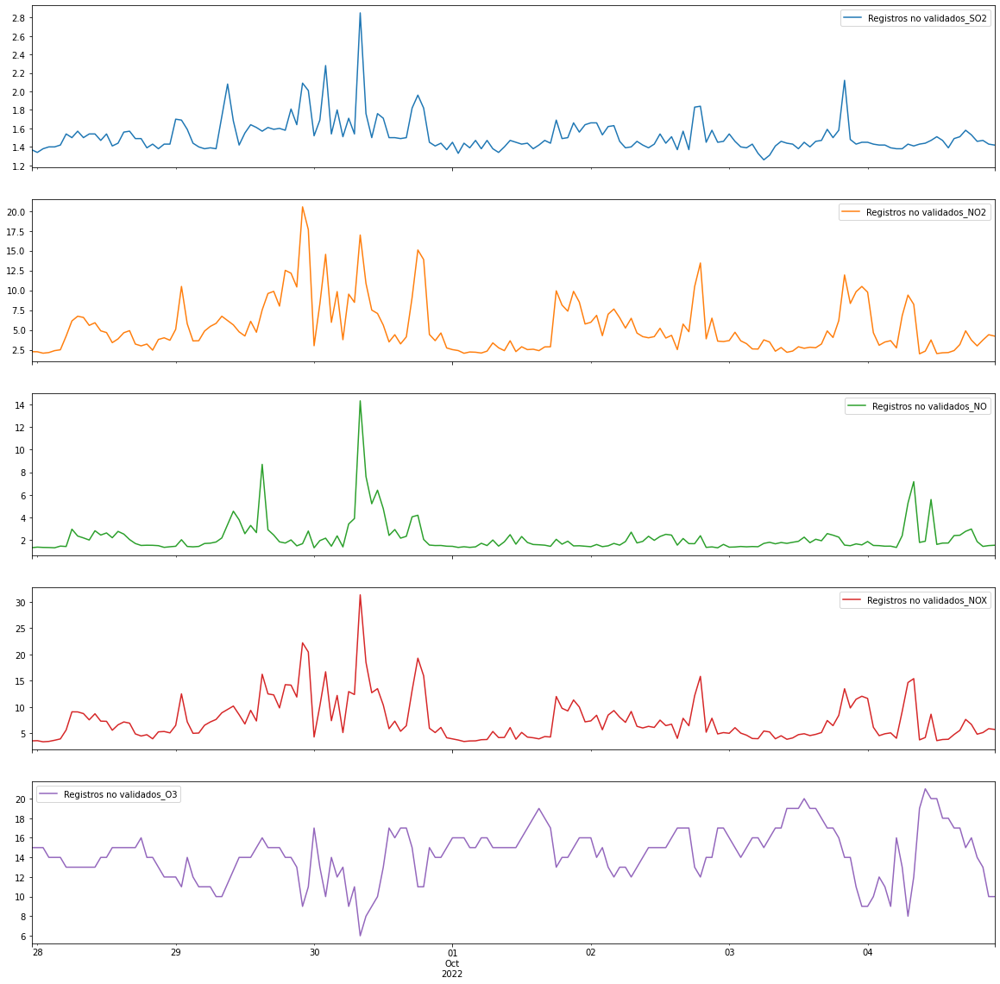

In [52]:
dataso = ver_ultima_semana(ventanas_df).rename(columns={"Registros no validados_SO2": "SO2", "Registros no validados_NO2": "NO2", "Registros no validados_NO": "NO", "Registros no validados_NOX": "NOX", "Registros no validados_O3": "O3", "Registros no validados_CO": "CO"})

In [53]:
dataso["day"] = dataso.index.day
dataso["month"] = dataso.index.month
dataso.groupby(["day", "month"]).mean()

,,SO2,NO2,NO,NOX,O3
day,month,,,,,
1,10,1.462083,3.996667,1.660972,5.658252,15.750000
2,10,1.519167,5.620000,1.833151,7.453310,14.541667
3,10,1.465417,4.475000,1.762577,6.237380,16.166667
4,10,1.448261,4.159565,2.400898,6.530837,14.260870
27,9,1.370000,2.260000,1.321170,3.585550,15.000000
28,9,1.465000,4.012917,1.905211,5.917711,13.916667
29,9,1.632500,7.975208,2.540666,10.515089,12.708333
30,9,1.684583,7.507917,3.437579,10.945862,12.791667


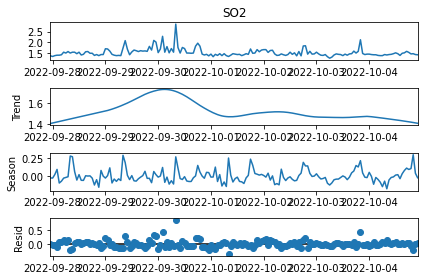

In [54]:
res = STL(dataso["SO2"]).fit()
res.plot()
plt.show()

# EDA Medium

In [55]:
ventanas_df = ventanas_df.rename(columns={"Registros no validados_SO2": "SO2", "Registros no validados_NO2": "NO2", "Registros no validados_NO": "NO", "Registros no validados_NOX": "NOX", "Registros no validados_O3": "O3", "Registros no validados_CO": "CO"})
ventanas_df

,SO2,NO2,NO,NOX,O3
2017-10-04 18:00:00,2.31,4.54,2.05393,6.50358,15.0
2017-10-04 19:00:00,2.12,3.65,1.63730,5.28568,16.0
2017-10-04 20:00:00,2.15,3.59,1.64193,5.22860,17.0
2017-10-04 21:00:00,2.01,3.40,1.67473,5.07702,16.0
2017-10-04 22:00:00,2.11,3.40,1.62698,5.02203,16.0
...,...,...,...,...,...
2022-10-04 19:00:00,1.46,2.99,1.86067,4.85557,14.0
2022-10-04 20:00:00,1.47,3.73,1.43493,5.16561,13.0
2022-10-04 21:00:00,1.43,4.40,1.50767,5.90353,10.0
2022-10-04 22:00:00,1.42,4.23,1.53685,5.76197,10.0


In [56]:
ventanas_ma_df = get_minma_data(['velviento', 'temp', 'dirviento00'], 'concon', from_last=from_last, n_cols = 3)
ventanas_ma_df = ventanas_ma_df.rename(columns={"Unnamed: 2_velviento": "VelViento", "Unnamed: 2_temp": "Temperatura", "Unnamed: 2_dirviento00": "DirViento"})
ventanas_ma_df.head()

c:\users\nicol\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version
  """Entry point for launching an IPython kernel.


,VelViento,Temperatura,DirViento
2017-09-28 18:00:00,0.701297,12.9519,307.335
2017-09-28 19:00:00,0.189222,12.8652,341.265
2017-09-28 20:00:00,0.713454,12.6152,268.001
2017-09-28 21:00:00,0.835072,12.6785,248.214
2017-09-28 22:00:00,0.205688,12.8185,215.089


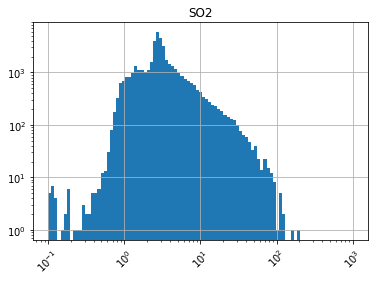

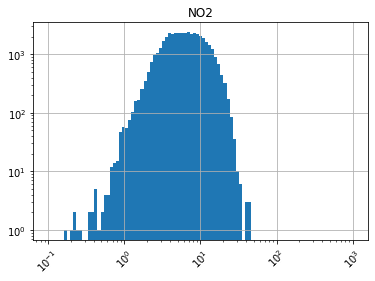

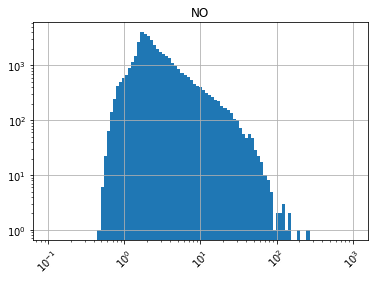

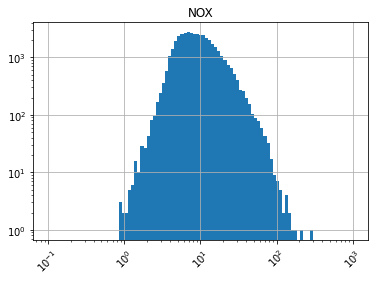

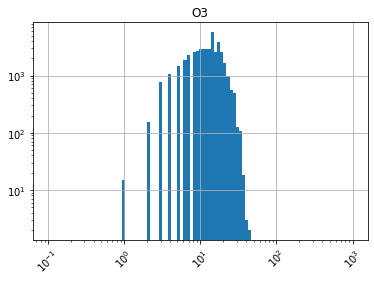

In [57]:
for col in ['SO2','NO2','NO','NOX', 'O3']:
    ventanas_df.hist(col, bins = np.logspace(-1,3,100), log =True)
    #sns.countplot(concon_df[col])
    plt.title(col)
    plt.xscale("log")
    plt.xticks(rotation=45)
    plt.show()

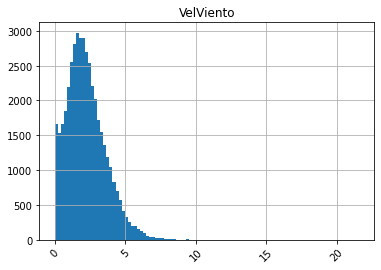

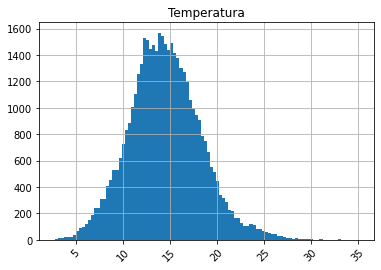

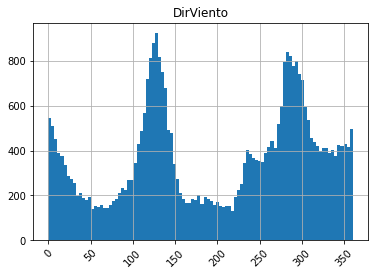

In [58]:
for col in ['VelViento','Temperatura','DirViento']:
    ventanas_ma_df.hist(col, bins = 100)
    #sns.countplot(concon_df[col])
    plt.title(col)
    plt.xticks(rotation=45)
    plt.show()

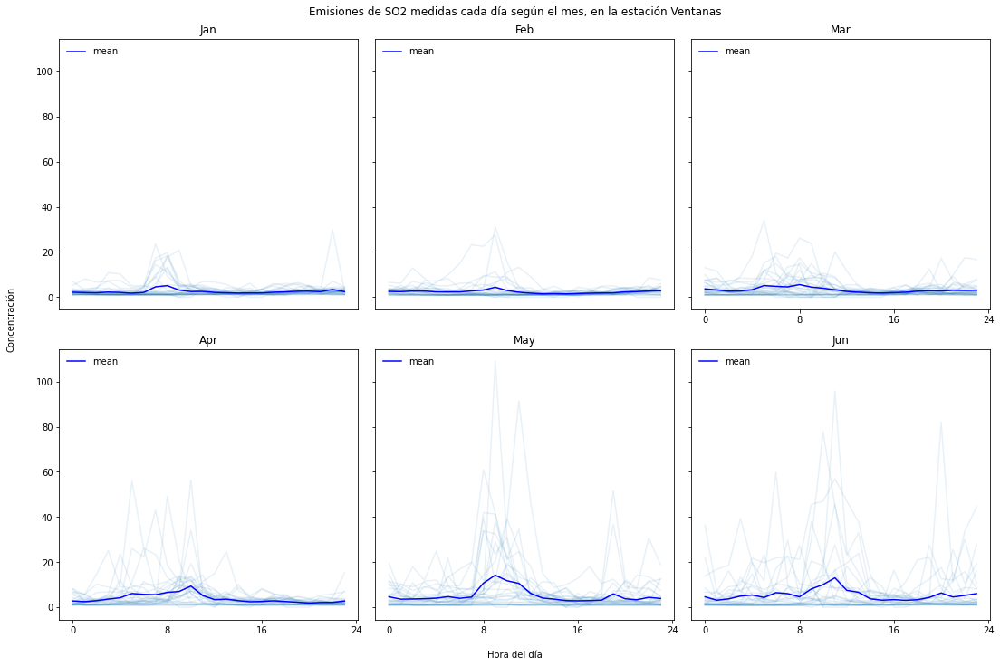

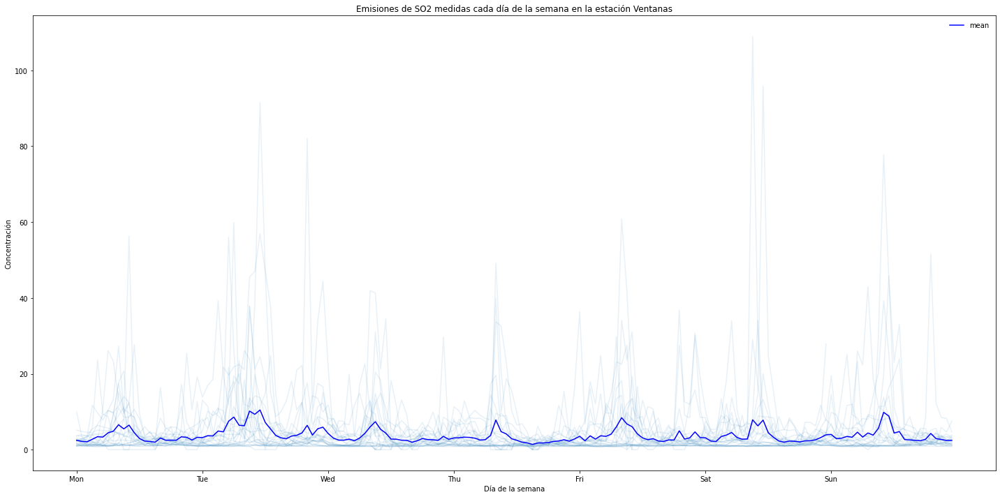

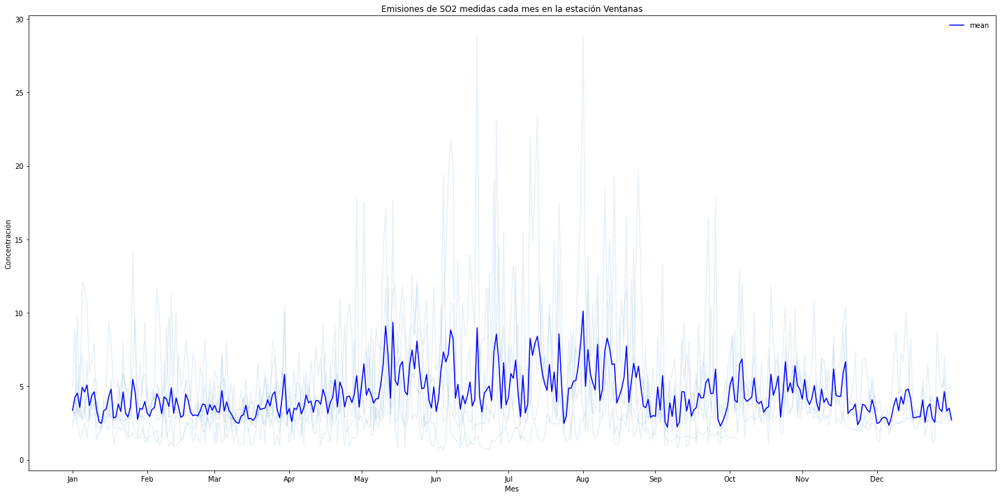

In [59]:
visualizar_trends(ventanas_df, col = "SO2", ano_0=2019, log =False)

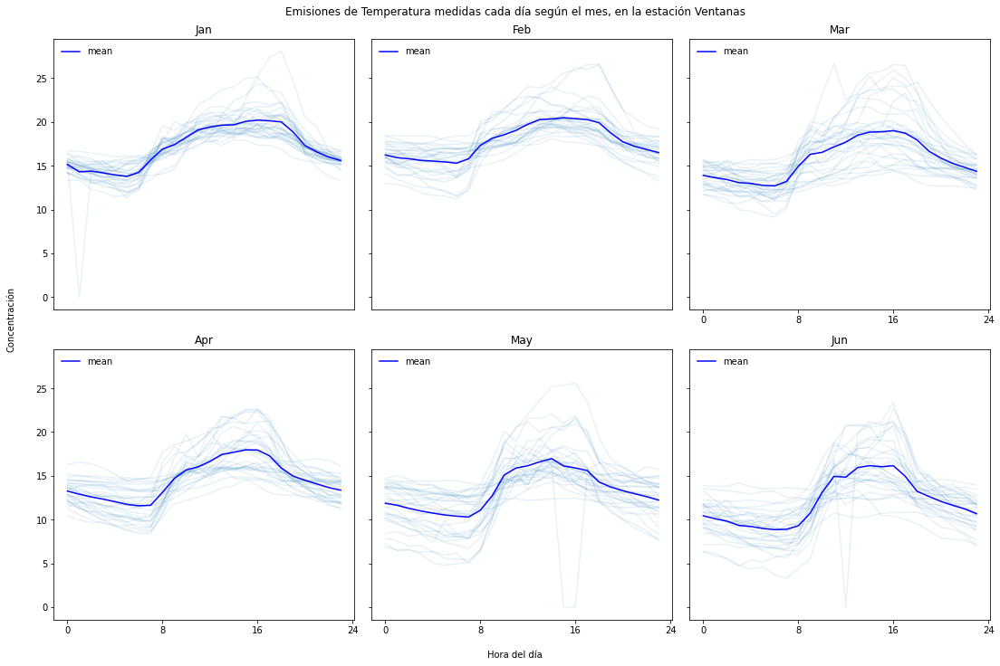

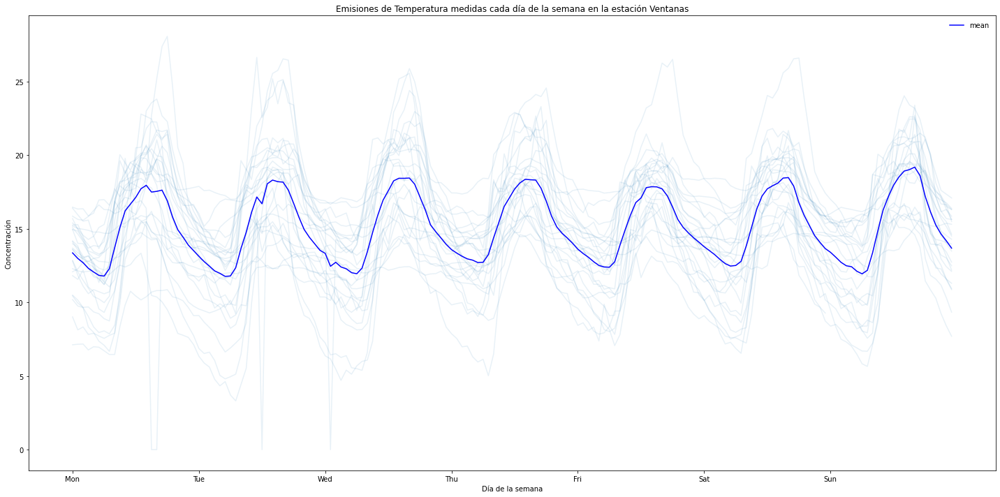

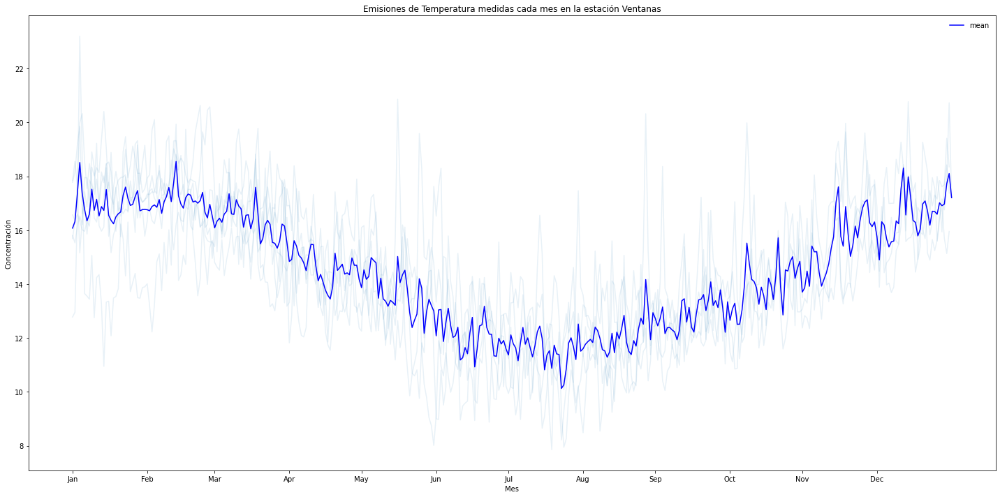

In [60]:
visualizar_trends(ventanas_ma_df, col = "Temperatura", ano_0=2019)

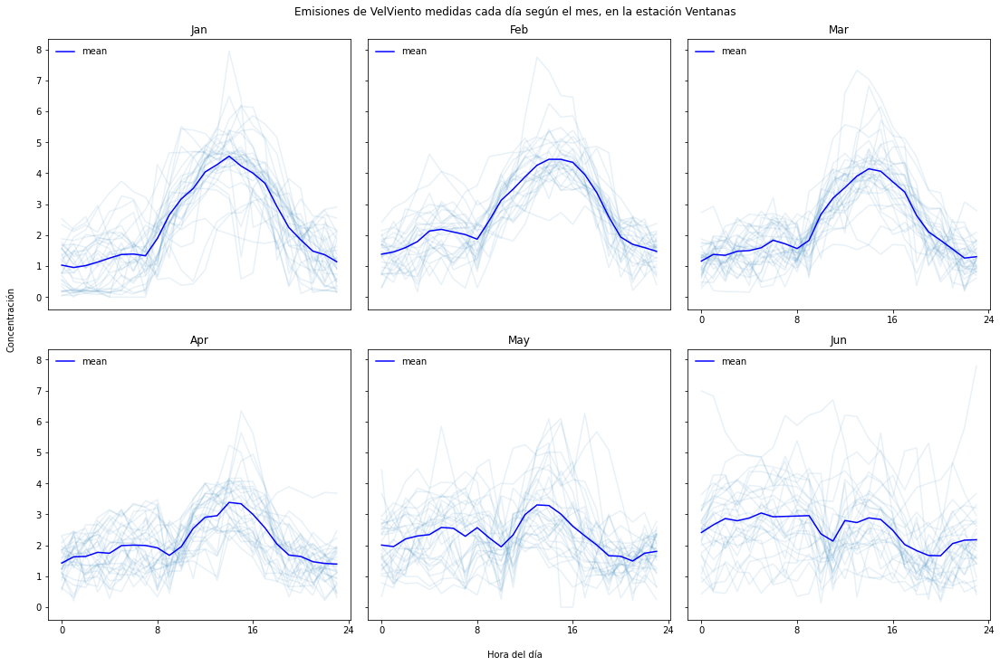

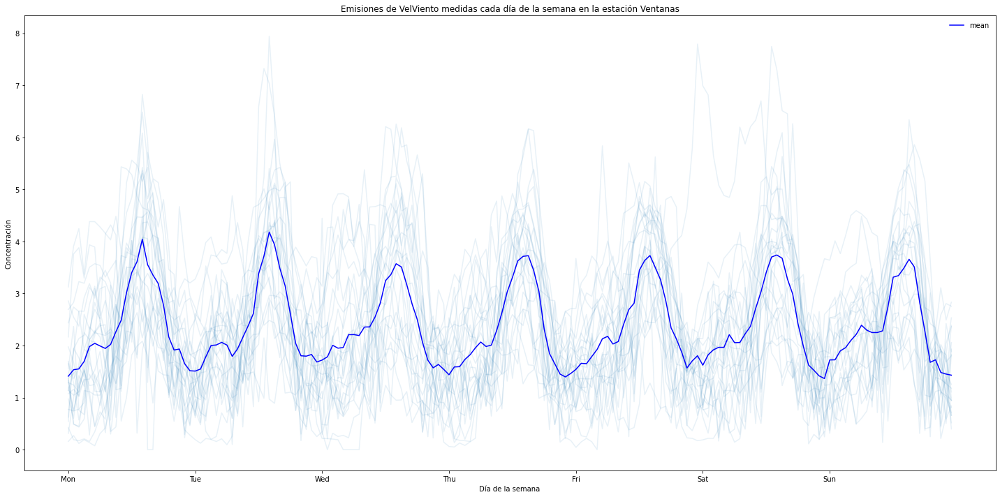

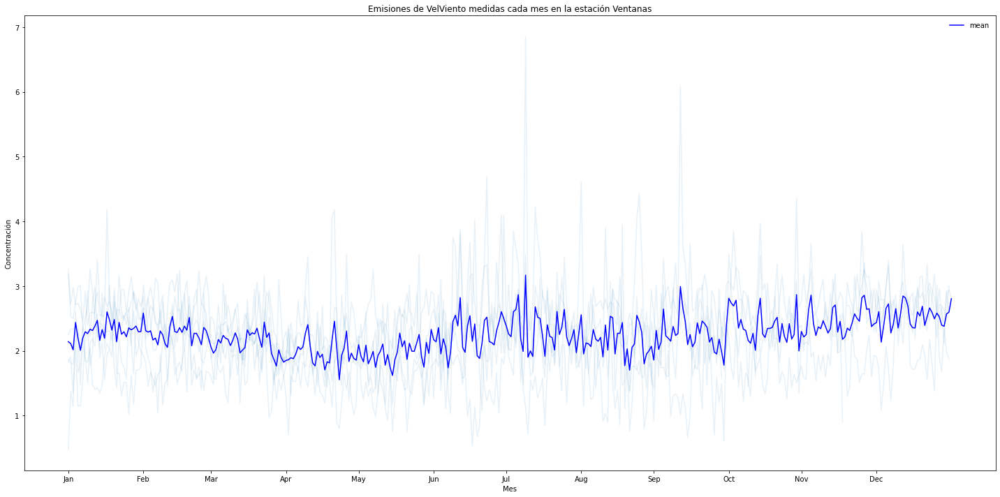

In [61]:
visualizar_trends(ventanas_ma_df, col = "VelViento", ano_0=2019)

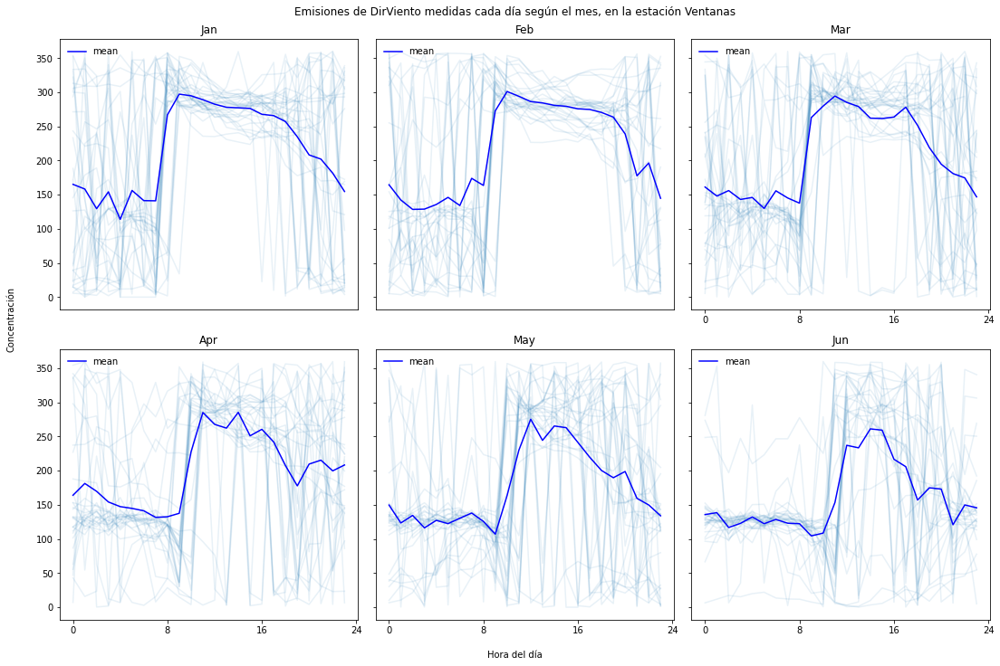

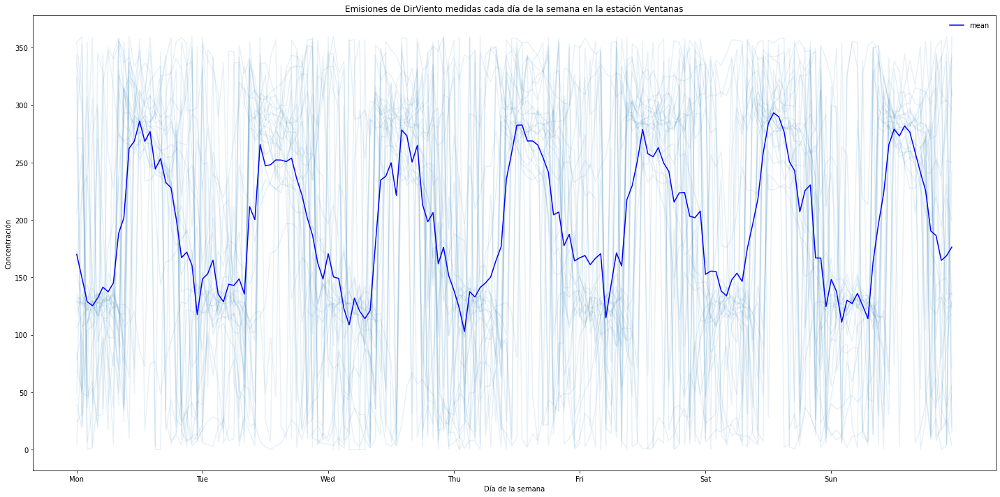

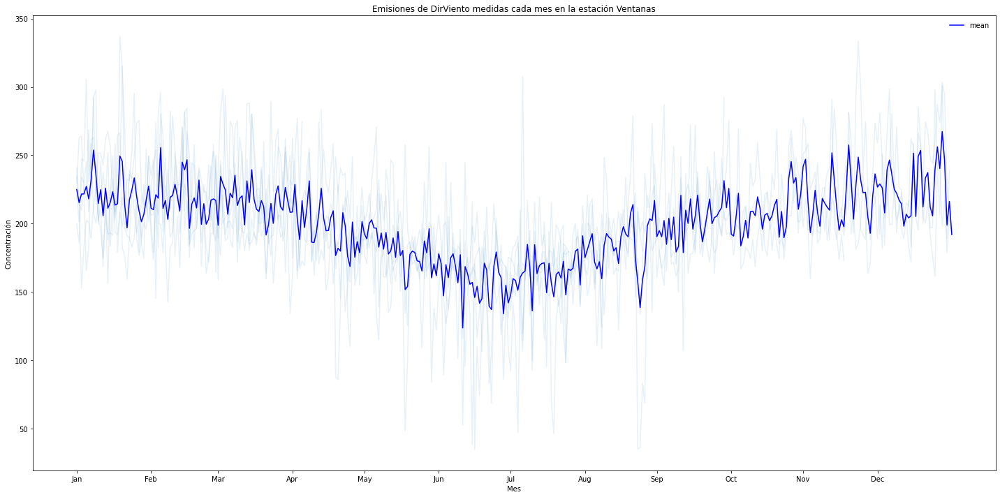

In [62]:
visualizar_trends(ventanas_ma_df, col = "DirViento", ano_0=2019, circular = False)

c:\users\nicol\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


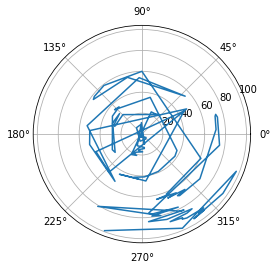

In [63]:
aaa = ventanas_ma_df.iloc[-100:]
aaa['rad'] = aaa.apply(lambda row: row.DirViento*np.pi/180, axis=1)
plt.polar(aaa['rad'], range(len(aaa.values))) #aaa["VelViento"])
#concon_ma_df


In [64]:
import plotly.express as px
import plotly.graph_objects as go

fig = go.Figure()
trace1 = px.line_polar(theta=aaa["DirViento"], r=range(len(aaa.values)))
trace2 = px.scatter_polar(theta=aaa["DirViento"], r=range(len(aaa.values)), color=range(len(aaa.values)), color_continuous_scale='hot')

fig.add_trace(trace1.data[0])
fig.add_trace(trace2.data[0])

#fig = px.scatter_polar(df, r="frequency", theta="direction")
fig.show()

In [66]:
concon_ma_df["VelViento"].apply(lambda x: np.mean(x), axis = 1)

TypeError: <lambda>() got an unexpected keyword argument 'axis'

## Ventanas

In [ ]:
timeseries = ventanas_df
timeseries["week"] = timeseries.index.isocalendar().week
timeseries["day_of_month"] = timeseries.index.day
timeseries["month"] = timeseries.index.month
timeseries["year"] = timeseries.index.year

In [ ]:
ano_elegido = 2022
days = []
for mes in range(12):
    for x in timeseries[["SO2", "day_of_month", "month", "year"]].query("month == {} and year == {}". format(mes+1, ano_elegido)).groupby("day_of_month"):
        #print(x[1])
        days.append(x[1]["SO2"].interpolate().fillna(0))
        #print(np.mean(x[1]["SO2"].interpolate()), np.max(x[1]["SO2"].interpolate()))
print(len(days))

In [ ]:
import numpy
import matplotlib.pyplot as plt
import seaborn as sns

from tslearn.clustering import TimeSeriesKMeans, KShape, KernelKMeans
from tslearn.datasets import CachedDatasets
from tslearn.preprocessing import TimeSeriesScalerMeanVariance, TimeSeriesResampler

In [ ]:
X_train = days
seed = 0
print(X_train)
fechas = dict([((s.index.day.max(), s.index.month.max(), s.index.year.max()), i) for i, s in enumerate(X_train)])
print(fechas)

In [ ]:
def plot_clusters(X_train, y_pred, N_clusters, clustering_name, estimator):
    fig, ax =  plt.subplots(N_clusters, figsize = (12, N_clusters))
    for yi in range(N_clusters):
        booleano = y_pred == yi
        for i, xx in enumerate(X_train):
            if booleano[i]:
                sns.lineplot(x = range(24), y = xx.ravel(), color = "k", ax = ax[yi], alpha=.2)
        if clustering_name != "GAK KMeans":
            sns.lineplot(x = range(24), y = estimator.cluster_centers_[yi].ravel(), color = "r", ax = ax[yi], label = "Cluster {}".format(yi))
        ax[yi].set_xlim(0,24)
    ax[0].set(title=clustering_name)
    plt.legend(loc = "upper right")
    plt.tight_layout()
    plt.show()
    
def test_clusterings(X_train, N_clusters, method = "Euclidean KMeans"):
    if method == "Euclidean KMeans":
        estimator = TimeSeriesKMeans(n_clusters= N_clusters, verbose=True, random_state=seed)
    elif method ==  "Soft-DTW KMeans": 
        estimator = TimeSeriesKMeans(n_clusters= N_clusters,
                           metric="softdtw",
                           metric_params={"gamma": .01},
                           verbose=True,
                           random_state=seed)
    elif method == "DBA KMeans":
        estimator = TimeSeriesKMeans(n_clusters = N_clusters,
                          n_init=2,
                          metric="dtw",
                          verbose=True,
                          max_iter_barycenter=10,
                          random_state=seed)
    elif method == "KShape":
        estimator = KShape(n_clusters= N_clusters, n_init=1, random_state=seed)
    elif method == "GAK KMeans":
        estimator = KernelKMeans(n_clusters=N_clusters, kernel="gak", random_state=seed)
    print(method)
    y_pred = estimator.fit_predict(X_train)
    plot_clusters(X_train, y_pred, N_clusters, method, estimator)
    return y_pred, estimator

In [ ]:
N_clusters = 5
test_clusterings(X_train, N_clusters, "Soft-DTW KMeans")

In [ ]:
# Euclidean k-means
test_clusterings(X_train, N_clusters, "Euclidean KMeans")

In [ ]:
# DBA-k-means
test_clusterings(X_train, N_clusters, "DBA KMeans")

In [ ]:
test_clusterings(X_train, N_clusters, "KShape")

In [ ]:
test_clusterings(X_train, N_clusters, "GAK KMeans")

## Ver dónde cae una cierta fecha

In [ ]:
days = []
for ano_elegido in [2018, 2019, 2022]:
    for mes in range(12):
        for x in timeseries[["SO2", "day_of_month", "month", "year"]].query("month == {} and year == {}". format(mes+1, ano_elegido)).groupby("day_of_month"):
            #print(x[1])
            days.append(x[1]["SO2"].interpolate().fillna(0))
            #print(np.mean(x[1]["SO2"].interpolate()), np.max(x[1]["SO2"].interpolate()))
print(len(days))

In [ ]:
N_clusters = 11
fechas = dict([((s.index.day.max(), s.index.month.max(), s.index.year.max()), i) for i, s in enumerate(days)])
# Entrenamos sólo con los datos del 2018
X_train = days[:365]
# Pero evaluaremos en las fechas que consideramos interesantes
X_total = days
seed = 0
#print(fechas)

In [ ]:
# Euclidean k-means
y_pred, km = test_clusterings(X_train, N_clusters, "Euclidean KMeans")

In [ ]:
fechas_interesantes = [(19,8,2018), (1,10,2019), (6,6,2022)]
ts_dias = [X_total[fechas[f]] for f in fechas_interesantes]

In [ ]:
for i, s in enumerate(ts_dias):
    plt.plot(range(24), s, label = "{}".format(fechas_interesantes[i]))
plt.legend()
plt.show()

In [ ]:
km.predict(ts_dias)

## Filtrar datos

Se filtran los datos para obtener solo en los escenarios críticos.

In [68]:
ventanas_ma_df

,VelViento,Temperatura,DirViento,Fecha
2017-09-28 18:00:00,0.701297,12.9519,307.335,2017-09-28 18:00:00
2017-09-28 19:00:00,0.189222,12.8652,341.265,2017-09-28 19:00:00
2017-09-28 20:00:00,0.713454,12.6152,268.001,2017-09-28 20:00:00
2017-09-28 21:00:00,0.835072,12.6785,248.214,2017-09-28 21:00:00
2017-09-28 22:00:00,0.205688,12.8185,215.089,2017-09-28 22:00:00
...,...,...,...,...
2022-09-28 19:00:00,NaN,NaN,301.563,2022-09-28 19:00:00
2022-09-28 20:00:00,NaN,NaN,323.776,2022-09-28 20:00:00
2022-09-28 21:00:00,NaN,NaN,338.470,2022-09-28 21:00:00
2022-09-28 22:00:00,NaN,NaN,293.250,2022-09-28 22:00:00


In [75]:
a= ventanas_df["SO2"] > 133
a.sum() #/ len(a)

2